In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("arbazkhan971/cuhk-face-sketch-database-cufs")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/cuhk-face-sketch-database-cufs


In [2]:
import os
import numpy as np
import pandas as pd
import cv2
from sklearn.metrics import f1_score
import tensorflow as tf
from tensorflow.keras.layers import Dense, Activation,Dropout,Conv2D, MaxPooling2D,BatchNormalization, Flatten
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.models import Sequential
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.signal import savgol_filter

In [3]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image


In [4]:
import warnings


In [5]:
warnings.filterwarnings("ignore")

In [6]:
folder_path = path

In [7]:
class_name = os.listdir(folder_path)

In [8]:
print(class_name)

['sketch_points', 'photos', 'cropped_sketch', 'sketch', 'photo_points', 'sketches', 'photo', 'original_sketch']


In [9]:
img = cv2.imread(os.path.join('/kaggle/input/cuhk-face-sketch-database-cufs/sketches/F2-007-01-sz1.jpg'))

In [10]:
img

array([[[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[253, 253, 253],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       ...,

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [253, 253, 253],
        [160, 160, 160],
        [  2,   2,   2]],

       [[254, 254, 254],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [255, 255, 255],
        [129, 129, 129],
        [  2,   2,   2]],

       [[254, 254, 254],
        [253, 253, 253],
        [253, 253, 253],
        ...,
        [255, 255, 255],
        [129, 129, 129],
        [  2,   2,   2]]

In [11]:
img.shape


(250, 200, 3)

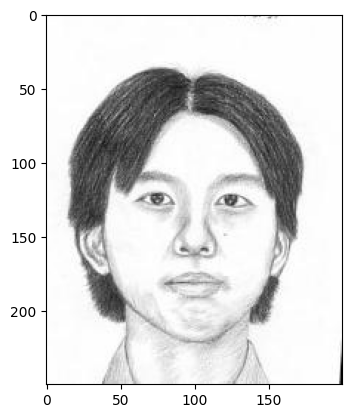

In [12]:
plt.imshow(img)

In [13]:
import torchvision.transforms as transforms

# **DATA PREPROCESSING**

In [14]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),    # Resize both sketch & photo
    transforms.RandomHorizontalFlip(),  # Data augmentation
    transforms.ToTensor(),             # Convert to Tensor
    transforms.Normalize((0.5,), (0.5,))  # Normalize to [-1,1]
])
class ImageGenerationPair(Dataset):
    def __init__(self, sketch_dir, photo_dir, transform=None):
        self.sketch_dir = sketch_dir
        self.photo_dir = photo_dir
        self.transform = transform

        # Get all filenames
        sketch_files = sorted(os.listdir(sketch_dir))
        photo_files = sorted(os.listdir(photo_dir))

        # Create a dictionary mapping normalized identifiers to photo filenames
        self.photo_dict = {}
        for photo in photo_files:
            identifier = os.path.splitext(photo)[0]  # Remove file extension
            identifier = identifier.replace("f-", "")  # Remove "f-" from photo names
            self.photo_dict[identifier] = photo

        # Store valid sketch-photo pairs
        self.pairs = []
        for sketch in sketch_files:
            sketch_id = sketch.replace("F2-", "").replace("-sz1.jpg", "").lower()
            for photo in photo_files:
                photo_id = photo.replace("f-", "").replace(".jpg", "").lower()
                if sketch_id == photo_id:
                    self.pairs.append((sketch, photo))

        print(f"Total Matched Pairs: {len(self.pairs)}")

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        sketch_filename, photo_filename = self.pairs[idx]

        sketch_path = os.path.join(self.sketch_dir, sketch_filename)
        photo_path = os.path.join(self.photo_dir, photo_filename)

        # Load images
        sketch = Image.open(sketch_path).convert("RGB")
        photo = Image.open(photo_path).convert("RGB")

        # Apply transforms
        if self.transform:
            sketch = self.transform(sketch)
            photo = self.transform(photo)

        return sketch, photo



#dataset path
sketch_path = "/kaggle/input/cuhk-face-sketch-database-cufs/sketches"
photo_path = "/kaggle/input/cuhk-face-sketch-database-cufs/photos"
#creating dataset
dataset = ImageGenerationPair(sketch_path, photo_path, transform=transform)
sketch, photo = dataset[0]


Total Matched Pairs: 129


In [15]:
print("Sketch shape:", sketch.shape)
print("Photo shape:", photo.shape)

Sketch shape: torch.Size([3, 256, 256])
Photo shape: torch.Size([3, 256, 256])


In [16]:
for i, (sketch, photo) in enumerate(dataset.pairs):
    print(f"Pair {i+1}: Sketch={sketch}, Photo={photo}")


Pair 1: Sketch=F2-005-01-sz1.jpg, Photo=f-005-01.jpg
Pair 2: Sketch=F2-006-01-sz1.jpg, Photo=f-006-01.jpg
Pair 3: Sketch=F2-007-01-sz1.jpg, Photo=f-007-01.jpg
Pair 4: Sketch=F2-008-01-sz1.jpg, Photo=f-008-01.jpg
Pair 5: Sketch=F2-009-01-sz1.jpg, Photo=f-009-01.jpg
Pair 6: Sketch=F2-010-01-sz1.jpg, Photo=f-010-01.jpg
Pair 7: Sketch=F2-011-01-sz1.jpg, Photo=f-011-01.jpg
Pair 8: Sketch=F2-012-01-sz1.jpg, Photo=f-012-01.jpg
Pair 9: Sketch=F2-013-01-sz1.jpg, Photo=f-013-01.jpg
Pair 10: Sketch=F2-014-01-sz1.jpg, Photo=f-014-01.jpg
Pair 11: Sketch=F2-015-01-sz1.jpg, Photo=f-015-01.jpg
Pair 12: Sketch=F2-016-01-sz1.jpg, Photo=f-016-01.jpg
Pair 13: Sketch=F2-017-01-sz1.jpg, Photo=f-017-01.jpg
Pair 14: Sketch=F2-018-01-sz1.jpg, Photo=f-018-01.jpg
Pair 15: Sketch=F2-019-01-sz1.jpg, Photo=f-019-01.jpg
Pair 16: Sketch=F2-020-01-sz1.jpg, Photo=f-020-01.jpg
Pair 17: Sketch=F2-021-01-sz1.jpg, Photo=f-021-01.jpg
Pair 18: Sketch=F2-022-01-sz1.jpg, Photo=f-022-01.jpg
Pair 19: Sketch=F2-023-01-sz1.jpg, Ph

In [17]:
unique_sketches = set()
unique_photos = set()

for sketch, photo in dataset.pairs:
    unique_sketches.add(sketch)
    unique_photos.add(photo)

print(f"Unique Sketches: {len(unique_sketches)}")
print(f"Unique Photos: {len(unique_photos)}")


Unique Sketches: 129
Unique Photos: 129


**Splitting the data**

In [18]:
from torch.utils.data import random_split

In [19]:
print(f"Total dataset pairs: {len(dataset.pairs)}")
print(f"Unique sketches: {len(set([s for s, _ in dataset.pairs]))}")
print(f"Unique photos: {len(set([p for _, p in dataset.pairs]))}")


Total dataset pairs: 129
Unique sketches: 129
Unique photos: 129


In [20]:
train_dataset,val_dataset = random_split(dataset,[103,26])

train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4, pin_memory=True)
print("DataLoaders are ready!")

DataLoaders are ready!


In [21]:
sketches, photos = next(iter(train_loader))
print("Batch size:", sketches.shape, photos.shape)



Batch size: torch.Size([16, 3, 256, 256]) torch.Size([16, 3, 256, 256])


# **Visualize a batch**

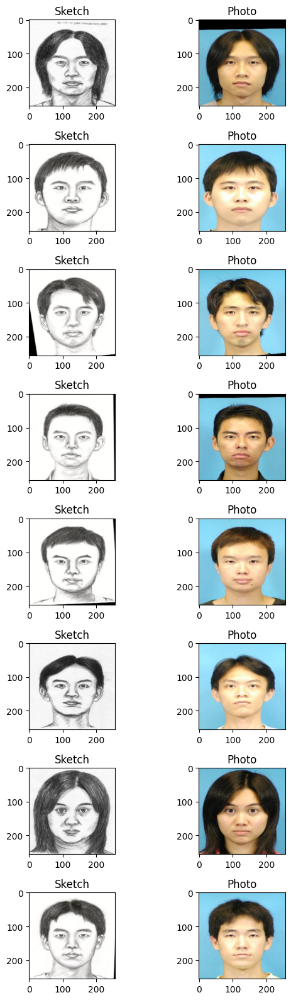

In [22]:
# Fetch one batch
sketches, photos = next(iter(train_loader))

# Convert to NumPy for visualization
sketches = sketches.permute(0, 2, 3, 1).numpy() * 0.5 + 0.5  # Denormalize
photos = photos.permute(0, 2, 3, 1).numpy() * 0.5 + 0.5

#ploting
num_img = 8  # Display 8 pairs (8 sketches & 8 photos)
fig, axes = plt.subplots(num_img, 2, figsize=(6, 2*num_img))  # 2 columns (Sketch & Photo)

for i in range(num_img):
    # Sketch Image
    axes[i, 0].imshow(sketches[i])
    axes[i, 0].set_title("Sketch")
    axes[i, 0].axis("on")

    # Photo Image
    axes[i, 1].imshow(photos[i])
    axes[i, 1].set_title("Photo")
    axes[i, 1].axis("on")

plt.tight_layout()
plt.show()





In [23]:
print(f"Number of GPUs available: {torch.cuda.device_count()}")
for i in range(torch.cuda.device_count()):
    print(f"GPU {i}: {torch.cuda.get_device_name(i)}")

Number of GPUs available: 1
GPU 0: Tesla P100-PCIE-16GB


In [24]:
import torch.optim as optim
from torch.cuda.amp import GradScaler, autocast
import torch.nn as nn
import torch

# **Generator**

In [25]:
class Block(nn.Module):
    def __init__(self,in_channels,out_channels,down=True,act='relu',use_dropout=False):
        super().__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels,out_channels,4,2,1,bias=False,padding_mode='reflect')
            if down
            else nn.ConvTranspose2d(in_channels,out_channels,4,2,1,bias = False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU() if act =='relu' else nn.LeakyReLU(0.2)
        )
        self.use_dropout = use_dropout
        self.dropout = nn.Dropout(0.5)

    def forward(self,x):
        x = self.conv(x)
        return self.dropout(x) if self.use_dropout else x


class Generator(nn.Module):
    def __init__(self,in_channels = 3,features =64):
        super().__init__()
        self.initial_down = nn.Sequential(
            nn.Conv2d(in_channels,features,4,2,1,padding_mode='reflect'),
            nn.LeakyReLU(0.2),
        )#128

        self.down1 = Block(features,features*2,down=True,act='leaky',use_dropout=False)#64
        self.down2 = Block(features*2,features*4,down=True,act='leaky',use_dropout=False)#32
        self.down3 = Block(features*4,features*8,down=True,act='leaky',use_dropout=False)#16
        self.down4 = Block(features*8,features*8,down=True,act='leaky',use_dropout=False)#8
        self.down5 = Block(features*8,features*8,down=True,act='leaky',use_dropout=False)#4
        self.down6 = Block(features*8,features*8,down=True,act='leaky',use_dropout=False)#2
        self.down7 = Block(features*8,features*8,down=True,act='leaky',use_dropout=False)#2
        self.bottleneck = nn.Sequential(
            nn.Conv2d(features*8,features*8,4,2,1,padding_mode = 'reflect'),nn.ReLU()  #1x1
        )
        self.up1 = Block(features*8,features*8,down=False,act='relu',use_dropout=True)
        self.up2 = Block(features*8*2,features*8,down=False,act='relu',use_dropout=True)
        self.up3 = Block(features*8*2,features*8,down=False,act='relu',use_dropout=True)
        self.up4 = Block(features*8*2,features*8,down=False,act='relu',use_dropout=False)
        self.up5 = Block(features*8*2,features*4,down=False,act='relu',use_dropout=False)
        self.up6 = Block(features*4*2,features*2,down=False,act='relu',use_dropout=False)
        self.up7 = Block(features*2*2,features,down=False,act='relu',use_dropout=False)
        self.final_up = nn.Sequential(
            nn.ConvTranspose2d(features*2,in_channels,kernel_size=4,stride=2,padding=1),
            nn.Tanh() #pixel value between -1 and 1 
        )


    def forward (self,x):
        d1 = self.initial_down(x)
        d2 = self.down1(d1)
        d3 = self.down2(d2)
        d4 = self.down3(d3)
        d5 = self.down4(d4)
        d6 = self.down5(d5)
        d7 = self.down6(d6)
        bottleneck=self.bottleneck(d7)
        up1 = self.up1(bottleneck)
        up2 = self.up2(torch.cat([up1,d7],1))
        up3 = self.up3(torch.cat([up2,d6],1))
        up4 = self.up4(torch.cat([up3,d5],1))
        up5 = self.up5(torch.cat([up4,d4],1))
        up6 = self.up6(torch.cat([up5,d3],1))
        up7 = self.up7(torch.cat([up6,d2],1))
        return self.final_up(torch.cat([up7,d1],1))



def test():
    x = torch.randn((1,3,256,256))
    model = Generator(in_channels=3,features=64)
    preds=model(x)
    print(preds.shape)


if __name__ == "__main__":
    test()
        



torch.Size([1, 3, 256, 256])


# **Discriminator**

In [26]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNNBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride=2):
        super().__init__()
        self.conv = nn.Sequential(
                nn.Conv2d(
                    in_channels, out_channels, kernel_size=4, stride=stride, 
                    padding=1, bias=False, padding_mode='reflect'
                ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        return self.conv(x)

class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64,128,256,512]):
        super().__init__()
        self.initial = nn.Sequential(
            nn.Conv2d(in_channels*2, features[0], kernel_size=4, stride=2, 
                      padding=1, padding_mode='reflect'),
            nn.LeakyReLU(0.2),
        )
        layers = []
        in_c = features[0]
        for feature in features[1:]:
            layers.append(
                CNNBlock(in_c, feature, stride=1 if feature == features[-1] else 2)
            )
            in_c = feature

        layers.append(
            nn.Conv2d(
                in_c, 1, kernel_size=4, stride=1, padding=1, padding_mode='reflect'
            )
        )

        self.model = nn.Sequential(*layers)

    def forward(self, x, y):
        x = torch.cat([x, y], dim=1)
        x = self.initial(x)
        return self.model(x)

def test():
    x = torch.randn((1,3,256,256))
    y = torch.randn((1,3,256,256))
    model = Discriminator()
    preds = model(x, y)
    print(preds.shape)

if __name__ == "__main__":
    test()


torch.Size([1, 1, 30, 30])


# **Training Processs**

In [27]:
import torchvision.utils as vutils
from torch.optim.lr_scheduler import ReduceLROnPlateau

In [28]:
gen = Generator()
disc = Discriminator()

In [29]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.cuda.amp import GradScaler, autocast

def train_pix2pix(
    generator,
    discriminator,
    train_loader,
    val_loader,
    num_epochs=100,
    device="cuda" if torch.cuda.is_available() else "cpu",
    lambda_l1=100,
    save_path="best_generator.pth",
    display_interval=50
):
    """
    A stable Pix2Pix training loop using a standard LSGAN adversarial loss (MSE)
    and L1 reconstruction loss.
    """

    # Move models to device
    generator.to(device)
    discriminator.to(device)

    # -------------------------------------------------------------------------
    # 1) Choose losses consistent with LSGAN (MSE) for adversarial + L1 for reconstruction
    # -------------------------------------------------------------------------
    adversarial_loss = nn.MSELoss()
    l1_loss = nn.L1Loss()

    # -------------------------------------------------------------------------
    # 2) Optimizers
    # Typically, LR=2e-4 for generator, same for discriminator in Pix2Pix.
    # Weight decay is often 0 in Pix2Pix. Here we keep it small or remove it.
    # -------------------------------------------------------------------------
    optimizer_G = optim.Adam(
        generator.parameters(),
        lr=2e-4,
        betas=(0.5, 0.999),
        weight_decay=0.01  # usually set to 0 for Pix2Pix
    )
    optimizer_D = optim.Adam(
        discriminator.parameters(),
        lr=2e-4,
        betas=(0.5, 0.999),
        weight_decay=0.01
    )

    # -------------------------------------------------------------------------
    # 3) Learning rate scheduling
    # A simple approach is to keep a constant LR for the first half of epochs,
    # then linearly decay to 0. The get_lr_lambda function helps with that.
    # -------------------------------------------------------------------------
    def get_lr_lambda(epoch):
        # For the first half of training, return 1 (no change).
        # After that, linearly decay from 1 down to 0.
        if epoch < num_epochs // 2:
            return 1.0
        else:
            return 1.0 - (epoch - num_epochs // 2) / (num_epochs // 2 + 1)

    scheduler_G = optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=get_lr_lambda)
    scheduler_D = optim.lr_scheduler.LambdaLR(optimizer_D, lr_lambda=get_lr_lambda)

    # -------------------------------------------------------------------------
    # 4) Mixed precision (optional, can help with speed on GPUs with Tensor Cores)
    # -------------------------------------------------------------------------
    scaler = GradScaler()

    best_g_loss = float('inf')
    g_losses = []
    d_losses = []

    # -------------------------------------------------------------------------
    # 5) Start training
    # -------------------------------------------------------------------------
    for epoch in range(num_epochs):
        generator.train()
        discriminator.train()

        epoch_g_loss = 0.0
        epoch_d_loss = 0.0
        
        for batch_idx, (real_x, real_y) in enumerate(train_loader):
            real_x, real_y = real_x.to(device), real_y.to(device)

            # --------------------------------------------------------
            # (A) Train Discriminator
            # --------------------------------------------------------
            optimizer_D.zero_grad()

            with autocast():
                # Generate fake images
                fake_y = generator(real_x)

                # Real & Fake predictions
                real_preds = discriminator(real_x, real_y)
                fake_preds = discriminator(real_x, fake_y.detach())

                # For LSGAN, the real labels are 1, fake are 0
                real_loss = adversarial_loss(real_preds, torch.ones_like(real_preds))
                fake_loss = adversarial_loss(fake_preds, torch.zeros_like(fake_preds))

                d_loss = 0.3 * (real_loss + fake_loss)

            scaler.scale(d_loss).backward()
            # Optional gradient clipping (be sure to pick a reasonable max_norm)
            torch.nn.utils.clip_grad_norm_(discriminator.parameters(), 5.0)
            scaler.step(optimizer_D)

            # --------------------------------------------------------
            # (B) Train Generator
            # --------------------------------------------------------
            optimizer_G.zero_grad()

            with autocast():
                fake_y = generator(real_x)
                fake_preds = discriminator(real_x, fake_y)

                # Adversarial loss wants fake_preds near 1
                g_adv_loss = adversarial_loss(fake_preds, torch.ones_like(fake_preds))
                # L1 reconstruction loss
                g_l1_loss = l1_loss(fake_y, real_y) * lambda_l1
                g_total_loss = g_adv_loss + g_l1_loss

            scaler.scale(g_total_loss).backward()
            torch.nn.utils.clip_grad_norm_(generator.parameters(), 5.0)
            scaler.step(optimizer_G)
            scaler.update()

            # --------------------------------------------------------
            # Logging
            # --------------------------------------------------------
            epoch_g_loss += g_total_loss.item()
            epoch_d_loss += d_loss.item()

            if batch_idx % display_interval == 0:
                current_lr_g = optimizer_G.param_groups[0]['lr']
                current_lr_d = optimizer_D.param_groups[0]['lr']
                print(
                    f"Epoch [{epoch+1}/{num_epochs}]"
                    f"| D Loss: {d_loss.item():.4f} | G Loss: {g_total_loss.item():.4f} "
                    f"| LR G: {current_lr_g:.2e} | LR D: {current_lr_d:.2e}"
                )

        # Average losses for the epoch
        avg_g_loss = epoch_g_loss / len(train_loader)
        avg_d_loss = epoch_d_loss / len(train_loader)

        g_losses.append(avg_g_loss)
        d_losses.append(avg_d_loss)

        # Update LR schedulers
        scheduler_G.step()
        scheduler_D.step()

        # Save best generator
        if avg_g_loss < best_g_loss:
            best_g_loss = avg_g_loss
            torch.save(generator.state_dict(), save_path)
            print(f"✅ New best generator saved (Loss: {best_g_loss:.4f})")

        # Optional validation step
        if (epoch + 1) % 5 == 0:
            validate_and_generate_images(generator, val_loader, epoch, device)

    # -------------------------------------------------------------------------
    # 6) Final save & summary
    # -------------------------------------------------------------------------
    torch.save(generator.state_dict(), "final_generator.pth")
    plot_improved_losses(g_losses, d_losses)  
    print("Training complete!")

# **PLOTTING**

In [30]:
def plot_improved_losses(g_losses, d_losses):
    plt.figure(figsize=(12, 6))
    
    # Smoothing with Savitzky-Golay filter
    window_size = 15
    g_smooth = savgol_filter(g_losses, window_size, 3)
    d_smooth = savgol_filter(d_losses, window_size, 3)
    
    plt.plot(g_smooth, 'b-', lw=2, label='Generator Loss (smoothed)')
    plt.plot(d_smooth, 'r-', lw=2, label='Discriminator Loss (smoothed)')
    
    plt.title('Training Losses with Stabilization Techniques', fontsize=14)
    plt.xlabel('Epochs', fontsize=12)
    plt.ylabel('Loss Value (log scale)', fontsize=12)
    plt.yscale('log')
    plt.grid(True, which='both', alpha=0.4)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

In [31]:
import random 
def validate_and_generate_images(generator, val_loader, epoch, device):
    generator.eval()
    discriminator.eval()
    with torch.no_grad():
        val_batches = list(iter(val_loader))
        real_x, real_y = random.choice(val_batches)  # Select a random batch
        real_x, real_y = real_x.to(device), real_y.to(device)
        fake_y = generator(real_x)  # Generate images

    # Convert to CPU and Unnormalize if needed
    real_x = real_x.cpu()
    real_y = real_y.cpu()
    fake_y = fake_y.cpu()

    # Create a grid of images
    img_grid = torch.cat((real_x, fake_y, real_y), dim=0)
    img_grid = vutils.make_grid(img_grid, normalize=True, nrow=real_x.size(0))

    # Display images
    plt.figure(figsize=(10,5))
    plt.imshow(img_grid.permute(1, 2, 0))
    plt.title(f"Generated Images at Epoch {epoch+1}")
    plt.axis("off")
    plt.show()


In [32]:
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
import os

class SketchTestDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_files = [f for f in os.listdir(root_dir) if f.endswith('.jpg')]
        
        # Verify images exist
        for f in self.image_files:
            if not os.path.isfile(os.path.join(root_dir, f)):
                raise FileNotFoundError(f"Test image {f} not found in {root_dir}")

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root_dir, self.image_files[idx])
        image = Image.open(img_path).convert('RGB')  # Force RGB format
        
        if self.transform:
            image = self.transform(image)
            
        # Return dummy target (None) and filename for reference
        return image, self.image_files[idx]

# Use same transforms as training (modify if needed)
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Match training size
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # [-1, 1] range
])

# Create dataset and dataloader
test_dataset = SketchTestDataset(
    root_dir='/kaggle/input/testdatags',  # Path to directory with s1.jpg-s5.jpg
    transform=transform
)

test_loader = DataLoader(
    test_dataset,
    batch_size=4,  # Adjust based on your GPU memory
    shuffle=False,  # Important to maintain order
    num_workers=2
)


# **TEST CASE**

In [33]:
import torch
import matplotlib.pyplot as plt
import torchvision.utils as vutils

def test_generator(test_loader, model_path, device="cuda" if torch.cuda.is_available() else "cpu"):
    # Load trained generator
    generator = Generator().to(device)
    generator.load_state_dict(torch.load(model_path, map_location=device))
    generator.eval()
    
    # Get a single batch: (images, filenames)
    test_data = next(iter(test_loader))
    test_inputs, file_names = test_data  # file_names is just a list of strings
    
    # Move the input images to the device
    test_inputs = test_inputs.to(device)

    # Generate images
    with torch.no_grad():
        generated_images = generator(test_inputs)
    
    # Move back to CPU for visualization
    test_inputs = test_inputs.cpu()
    generated_images = generated_images.cpu()
    
    # Create comparison grids
    grid_input = vutils.make_grid(test_inputs, normalize=True, nrow=4)
    grid_generated = vutils.make_grid(generated_images, normalize=True, nrow=4)
    
    # Plot results
    fig, ax = plt.subplots(2, 1, figsize=(12, 8))
    
    ax[0].imshow(grid_input.permute(1, 2, 0))
    ax[0].set_title("Input Sketches")
    ax[0].axis("off")
    
    ax[1].imshow(grid_generated.permute(1, 2, 0))
    ax[1].set_title("Generated Images")
    ax[1].axis("off")
    
    plt.tight_layout()
    plt.show()
    
    # If you want to see which file names map to which images:
    print("Filenames in this batch:", file_names)


Epoch [1/100]| D Loss: 0.4123 | G Loss: 75.9086 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 78.0499)
Epoch [2/100]| D Loss: 0.2008 | G Loss: 76.9040 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 76.8333)
Epoch [3/100]| D Loss: 0.1584 | G Loss: 75.7380 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 75.5503)
Epoch [4/100]| D Loss: 0.1525 | G Loss: 74.8196 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 74.2083)
Epoch [5/100]| D Loss: 0.1492 | G Loss: 71.7361 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 72.9243)


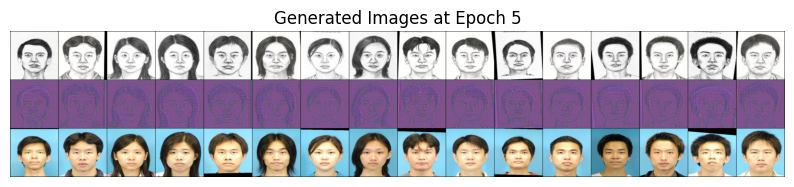

Epoch [6/100]| D Loss: 0.1412 | G Loss: 74.6412 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 71.1031)
Epoch [7/100]| D Loss: 0.1340 | G Loss: 69.9777 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 69.1969)
Epoch [8/100]| D Loss: 0.1338 | G Loss: 67.2989 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 67.6128)
Epoch [9/100]| D Loss: 0.1312 | G Loss: 67.2547 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 65.5263)
Epoch [10/100]| D Loss: 0.1293 | G Loss: 65.8344 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 63.6960)


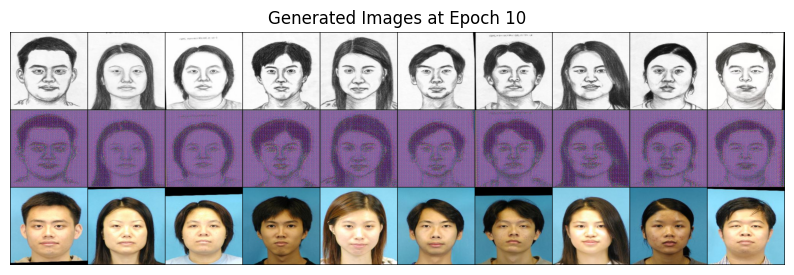

Epoch [11/100]| D Loss: 0.1260 | G Loss: 64.2454 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 61.9815)
Epoch [12/100]| D Loss: 0.1264 | G Loss: 60.4188 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 59.7747)
Epoch [13/100]| D Loss: 0.1298 | G Loss: 57.8133 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 58.0556)
Epoch [14/100]| D Loss: 0.1266 | G Loss: 56.4775 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 53.4656)
Epoch [15/100]| D Loss: 0.1354 | G Loss: 52.0674 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 48.9523)


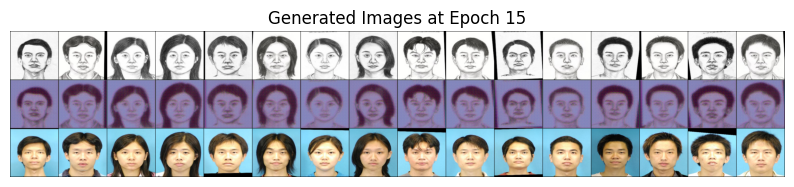

Epoch [16/100]| D Loss: 0.1363 | G Loss: 47.6017 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 46.2566)
Epoch [17/100]| D Loss: 0.1329 | G Loss: 45.9007 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 44.3786)
Epoch [18/100]| D Loss: 0.1563 | G Loss: 44.1853 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 43.0883)
Epoch [19/100]| D Loss: 0.1315 | G Loss: 46.0811 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 41.4479)
Epoch [20/100]| D Loss: 0.1586 | G Loss: 42.0175 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 40.8320)


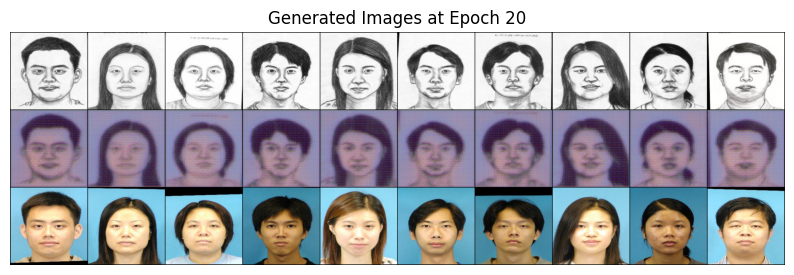

Epoch [21/100]| D Loss: 0.1537 | G Loss: 39.9306 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 40.7897)
Epoch [22/100]| D Loss: 0.1442 | G Loss: 39.2025 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 40.3795)
Epoch [23/100]| D Loss: 0.1582 | G Loss: 39.1658 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 40.3027)
Epoch [24/100]| D Loss: 0.1904 | G Loss: 38.6048 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 38.7154)
Epoch [25/100]| D Loss: 0.1654 | G Loss: 38.3988 | LR G: 2.00e-04 | LR D: 2.00e-04


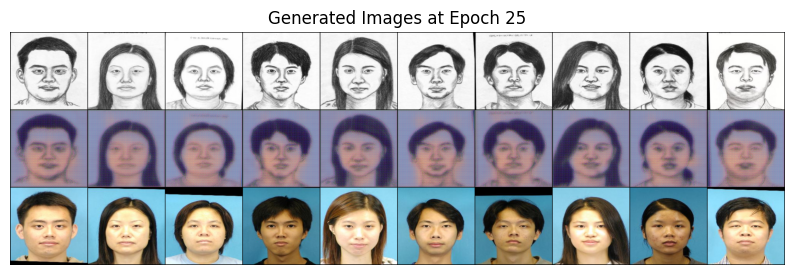

Epoch [26/100]| D Loss: 0.2213 | G Loss: 38.5232 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 38.6343)
Epoch [27/100]| D Loss: 0.1967 | G Loss: 38.7256 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 38.5709)
Epoch [28/100]| D Loss: 0.1814 | G Loss: 37.7341 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 37.5050)
Epoch [29/100]| D Loss: 0.1464 | G Loss: 40.2298 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [30/100]| D Loss: 0.1968 | G Loss: 38.8174 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 37.4464)


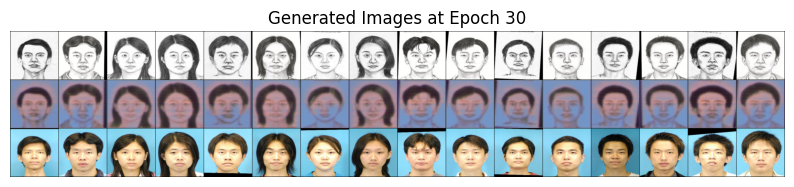

Epoch [31/100]| D Loss: 0.2307 | G Loss: 37.9972 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [32/100]| D Loss: 0.1716 | G Loss: 37.6263 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 37.2975)
Epoch [33/100]| D Loss: 0.1578 | G Loss: 33.5193 | LR G: 2.00e-04 | LR D: 2.00e-04
✅ New best generator saved (Loss: 37.1096)
Epoch [34/100]| D Loss: 0.1606 | G Loss: 36.5494 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [35/100]| D Loss: 0.1746 | G Loss: 39.5680 | LR G: 2.00e-04 | LR D: 2.00e-04


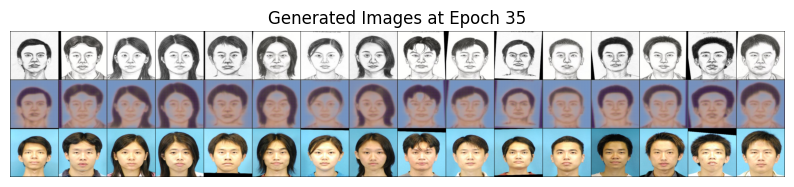

Epoch [36/100]| D Loss: 0.1762 | G Loss: 41.8569 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [37/100]| D Loss: 0.1571 | G Loss: 37.9761 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [38/100]| D Loss: 0.3303 | G Loss: 36.6382 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [39/100]| D Loss: 0.1747 | G Loss: 39.5177 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [40/100]| D Loss: 0.3068 | G Loss: 35.1376 | LR G: 2.00e-04 | LR D: 2.00e-04


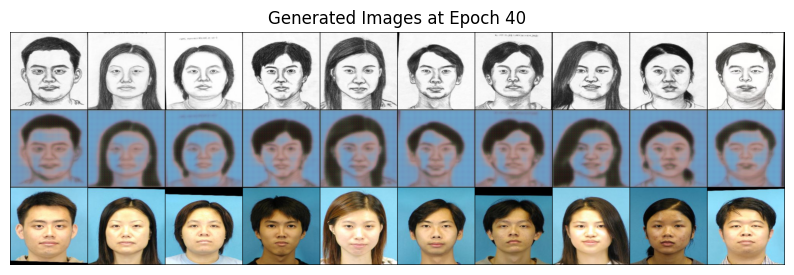

Epoch [41/100]| D Loss: 0.1725 | G Loss: 36.2904 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [42/100]| D Loss: 0.3544 | G Loss: 39.2924 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [43/100]| D Loss: 0.1775 | G Loss: 40.1284 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [44/100]| D Loss: 0.3017 | G Loss: 41.6428 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [45/100]| D Loss: 0.1954 | G Loss: 37.1052 | LR G: 2.00e-04 | LR D: 2.00e-04


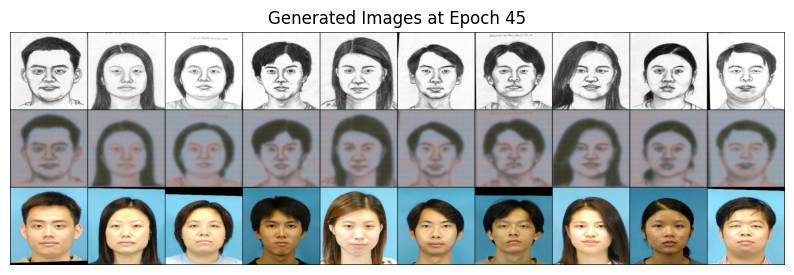

Epoch [46/100]| D Loss: 0.1651 | G Loss: 35.8788 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [47/100]| D Loss: 0.1618 | G Loss: 38.7541 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [48/100]| D Loss: 0.1848 | G Loss: 37.3222 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [49/100]| D Loss: 0.1613 | G Loss: 35.3846 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [50/100]| D Loss: 0.1703 | G Loss: 38.0804 | LR G: 2.00e-04 | LR D: 2.00e-04


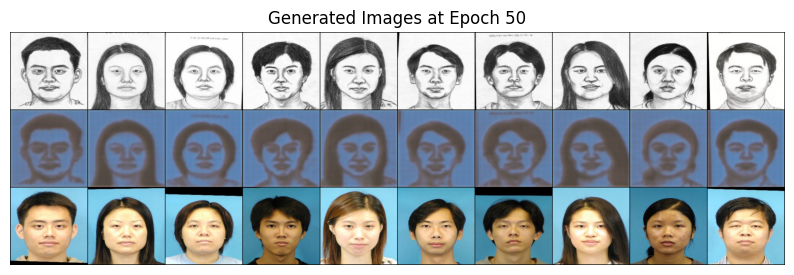

Epoch [51/100]| D Loss: 0.2232 | G Loss: 38.4867 | LR G: 2.00e-04 | LR D: 2.00e-04
Epoch [52/100]| D Loss: 0.1848 | G Loss: 37.8288 | LR G: 1.96e-04 | LR D: 1.96e-04
✅ New best generator saved (Loss: 36.6761)
Epoch [53/100]| D Loss: 0.1695 | G Loss: 37.7809 | LR G: 1.92e-04 | LR D: 1.92e-04
Epoch [54/100]| D Loss: 0.1814 | G Loss: 36.3596 | LR G: 1.88e-04 | LR D: 1.88e-04
Epoch [55/100]| D Loss: 0.2017 | G Loss: 36.2853 | LR G: 1.84e-04 | LR D: 1.84e-04


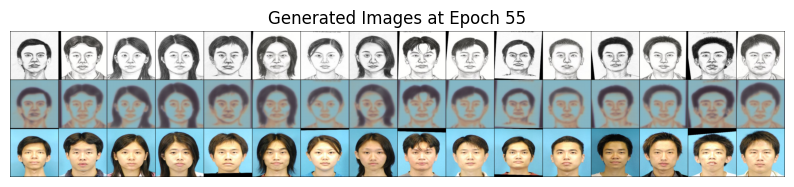

Epoch [56/100]| D Loss: 0.1586 | G Loss: 38.0537 | LR G: 1.80e-04 | LR D: 1.80e-04
Epoch [57/100]| D Loss: 0.1532 | G Loss: 35.7224 | LR G: 1.76e-04 | LR D: 1.76e-04
Epoch [58/100]| D Loss: 0.1776 | G Loss: 38.0078 | LR G: 1.73e-04 | LR D: 1.73e-04
✅ New best generator saved (Loss: 36.3404)
Epoch [59/100]| D Loss: 0.1864 | G Loss: 32.8753 | LR G: 1.69e-04 | LR D: 1.69e-04
✅ New best generator saved (Loss: 35.7131)
Epoch [60/100]| D Loss: 0.1888 | G Loss: 33.8934 | LR G: 1.65e-04 | LR D: 1.65e-04


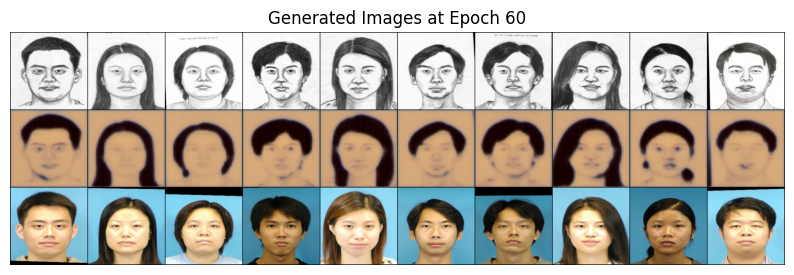

Epoch [61/100]| D Loss: 0.2379 | G Loss: 35.9505 | LR G: 1.61e-04 | LR D: 1.61e-04
Epoch [62/100]| D Loss: 0.1761 | G Loss: 33.6513 | LR G: 1.57e-04 | LR D: 1.57e-04
✅ New best generator saved (Loss: 35.2225)
Epoch [63/100]| D Loss: 0.2000 | G Loss: 33.0035 | LR G: 1.53e-04 | LR D: 1.53e-04
Epoch [64/100]| D Loss: 0.1668 | G Loss: 36.1444 | LR G: 1.49e-04 | LR D: 1.49e-04
Epoch [65/100]| D Loss: 0.1790 | G Loss: 36.3041 | LR G: 1.45e-04 | LR D: 1.45e-04


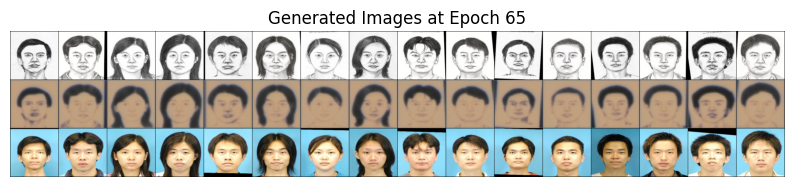

Epoch [66/100]| D Loss: 0.1658 | G Loss: 34.6817 | LR G: 1.41e-04 | LR D: 1.41e-04
Epoch [67/100]| D Loss: 0.1862 | G Loss: 37.2963 | LR G: 1.37e-04 | LR D: 1.37e-04
Epoch [68/100]| D Loss: 0.2636 | G Loss: 36.1067 | LR G: 1.33e-04 | LR D: 1.33e-04
Epoch [69/100]| D Loss: 0.1660 | G Loss: 35.8182 | LR G: 1.29e-04 | LR D: 1.29e-04
Epoch [70/100]| D Loss: 0.1683 | G Loss: 37.3401 | LR G: 1.25e-04 | LR D: 1.25e-04


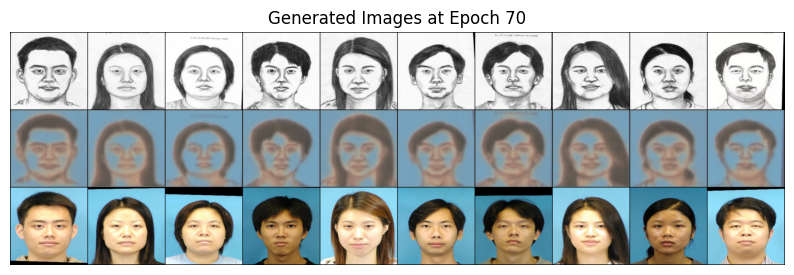

Epoch [71/100]| D Loss: 0.1732 | G Loss: 37.4295 | LR G: 1.22e-04 | LR D: 1.22e-04
Epoch [72/100]| D Loss: 0.1637 | G Loss: 35.7043 | LR G: 1.18e-04 | LR D: 1.18e-04
Epoch [73/100]| D Loss: 0.1572 | G Loss: 37.8767 | LR G: 1.14e-04 | LR D: 1.14e-04
Epoch [74/100]| D Loss: 0.2160 | G Loss: 32.6851 | LR G: 1.10e-04 | LR D: 1.10e-04
Epoch [75/100]| D Loss: 0.1725 | G Loss: 43.7764 | LR G: 1.06e-04 | LR D: 1.06e-04


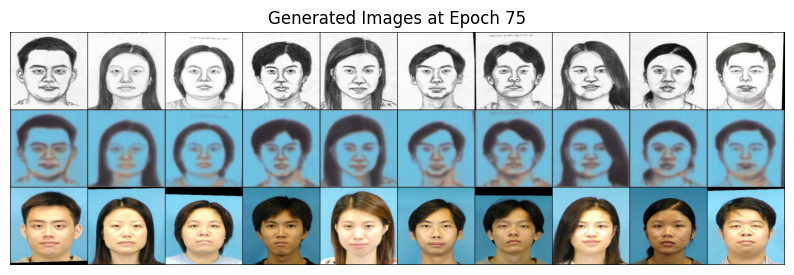

Epoch [76/100]| D Loss: 0.1712 | G Loss: 33.7923 | LR G: 1.02e-04 | LR D: 1.02e-04
Epoch [77/100]| D Loss: 0.2487 | G Loss: 34.1741 | LR G: 9.80e-05 | LR D: 9.80e-05
✅ New best generator saved (Loss: 33.8607)
Epoch [78/100]| D Loss: 0.1618 | G Loss: 33.9241 | LR G: 9.41e-05 | LR D: 9.41e-05
Epoch [79/100]| D Loss: 0.2256 | G Loss: 37.1092 | LR G: 9.02e-05 | LR D: 9.02e-05
✅ New best generator saved (Loss: 33.5258)
Epoch [80/100]| D Loss: 0.1865 | G Loss: 34.5745 | LR G: 8.63e-05 | LR D: 8.63e-05
✅ New best generator saved (Loss: 32.6780)


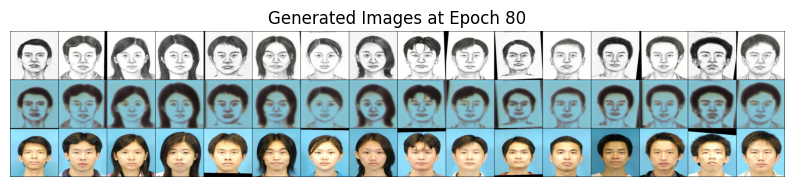

Epoch [81/100]| D Loss: 0.1734 | G Loss: 33.3867 | LR G: 8.24e-05 | LR D: 8.24e-05
Epoch [82/100]| D Loss: 0.1599 | G Loss: 29.6688 | LR G: 7.84e-05 | LR D: 7.84e-05
✅ New best generator saved (Loss: 31.6073)
Epoch [83/100]| D Loss: 0.2036 | G Loss: 32.7022 | LR G: 7.45e-05 | LR D: 7.45e-05
Epoch [84/100]| D Loss: 0.1625 | G Loss: 28.4257 | LR G: 7.06e-05 | LR D: 7.06e-05
Epoch [85/100]| D Loss: 0.1561 | G Loss: 30.0853 | LR G: 6.67e-05 | LR D: 6.67e-05


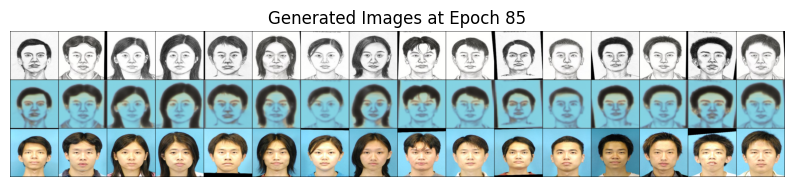

Epoch [86/100]| D Loss: 0.1544 | G Loss: 30.1760 | LR G: 6.27e-05 | LR D: 6.27e-05
✅ New best generator saved (Loss: 31.3441)
Epoch [87/100]| D Loss: 0.1753 | G Loss: 30.2519 | LR G: 5.88e-05 | LR D: 5.88e-05
✅ New best generator saved (Loss: 30.3185)
Epoch [88/100]| D Loss: 0.1595 | G Loss: 31.8452 | LR G: 5.49e-05 | LR D: 5.49e-05
Epoch [89/100]| D Loss: 0.1515 | G Loss: 29.5580 | LR G: 5.10e-05 | LR D: 5.10e-05
✅ New best generator saved (Loss: 29.7469)
Epoch [90/100]| D Loss: 0.1683 | G Loss: 30.0807 | LR G: 4.71e-05 | LR D: 4.71e-05


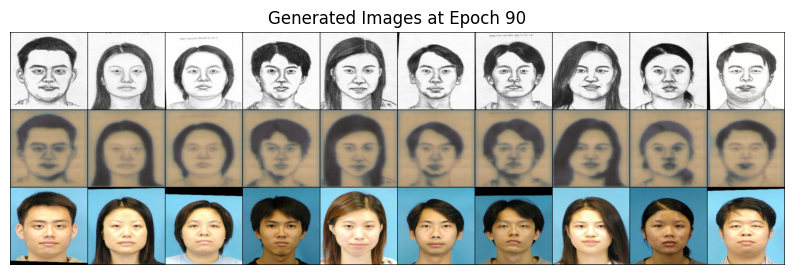

Epoch [91/100]| D Loss: 0.1605 | G Loss: 30.9799 | LR G: 4.31e-05 | LR D: 4.31e-05
Epoch [92/100]| D Loss: 0.1393 | G Loss: 28.6047 | LR G: 3.92e-05 | LR D: 3.92e-05
Epoch [93/100]| D Loss: 0.1520 | G Loss: 28.1095 | LR G: 3.53e-05 | LR D: 3.53e-05
Epoch [94/100]| D Loss: 0.1363 | G Loss: 30.2604 | LR G: 3.14e-05 | LR D: 3.14e-05
✅ New best generator saved (Loss: 29.2844)
Epoch [95/100]| D Loss: 0.1461 | G Loss: 30.8460 | LR G: 2.75e-05 | LR D: 2.75e-05


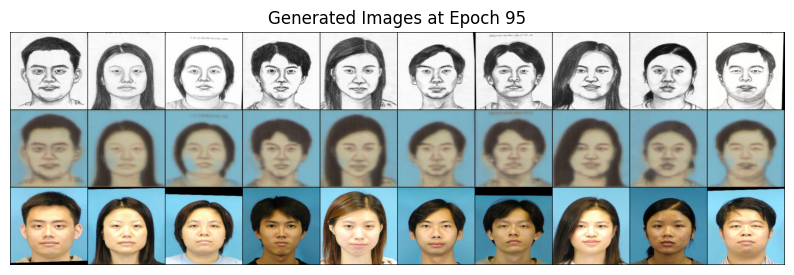

Epoch [96/100]| D Loss: 0.1511 | G Loss: 30.4469 | LR G: 2.35e-05 | LR D: 2.35e-05
Epoch [97/100]| D Loss: 0.1279 | G Loss: 28.3909 | LR G: 1.96e-05 | LR D: 1.96e-05
✅ New best generator saved (Loss: 28.9522)
Epoch [98/100]| D Loss: 0.0920 | G Loss: 27.5665 | LR G: 1.57e-05 | LR D: 1.57e-05
✅ New best generator saved (Loss: 28.1126)
Epoch [99/100]| D Loss: 0.1038 | G Loss: 26.3094 | LR G: 1.18e-05 | LR D: 1.18e-05
✅ New best generator saved (Loss: 28.0347)
Epoch [100/100]| D Loss: 0.0735 | G Loss: 29.5872 | LR G: 7.84e-06 | LR D: 7.84e-06


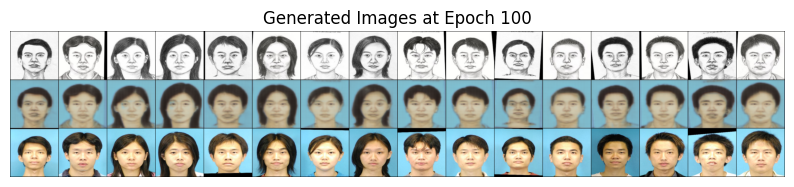

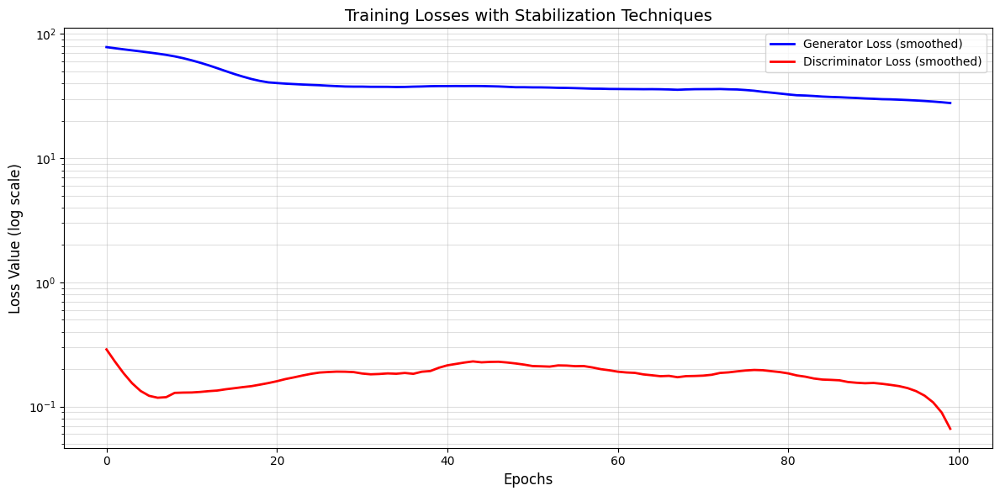

Training complete!


In [34]:
# Initialize Models
generator = Generator(in_channels=3, features=64)
discriminator = Discriminator(in_channels=3)
# Train the model
train_pix2pix(gen, disc, train_loader, val_loader, num_epochs=100)


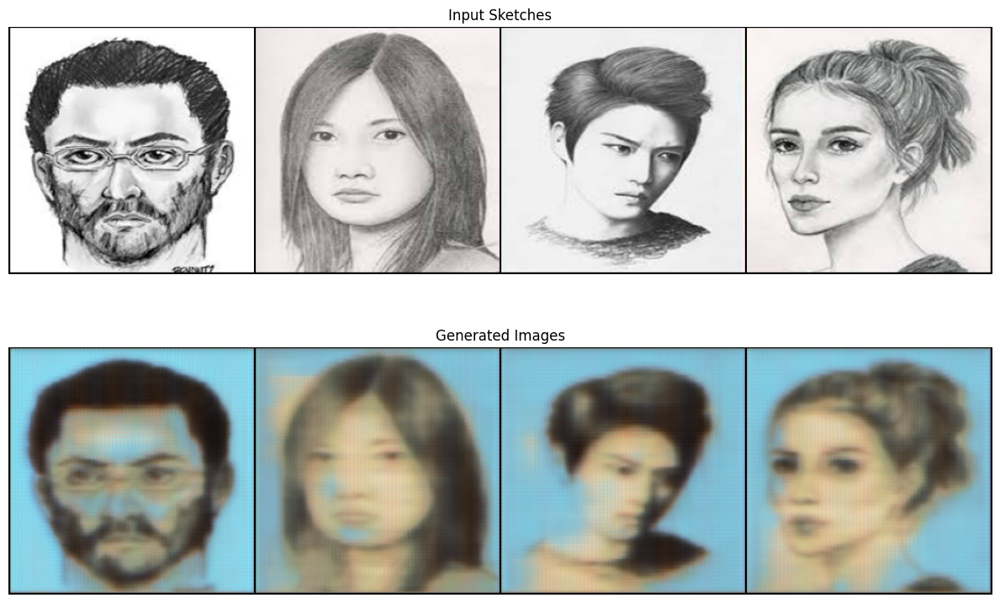

Filenames in this batch: ('s2.jpg', 's5.jpg', 's1.jpg', 's3.jpg')


In [35]:
test_generator(
    test_loader=test_loader,
    model_path="/kaggle/working/final_generator.pth",
    device=("cuda" if torch.cuda.is_available() else "cpu")
)


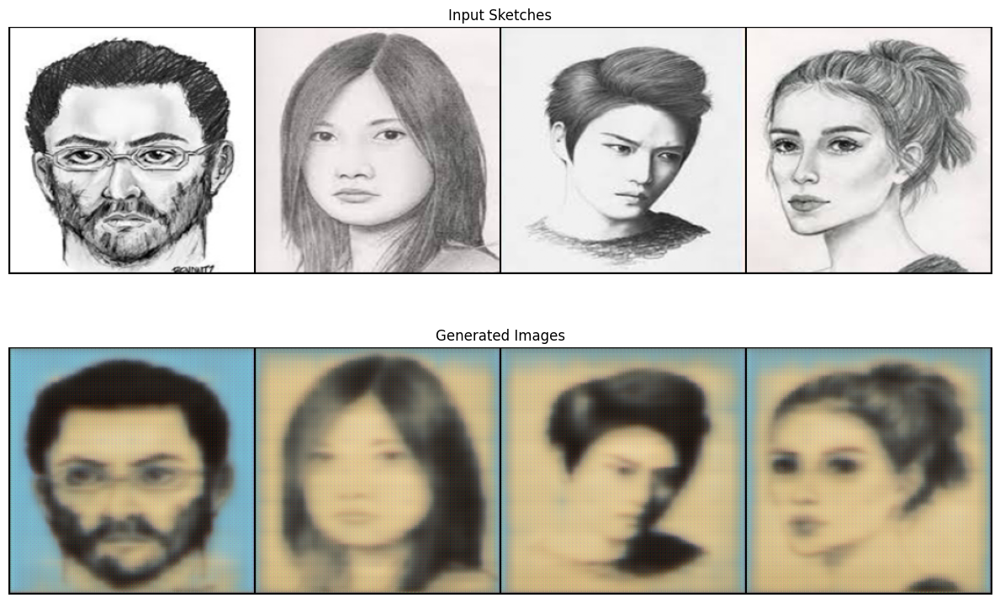

Filenames in this batch: ('s2.jpg', 's5.jpg', 's1.jpg', 's3.jpg')


In [37]:
test_generator(
    test_loader=test_loader,
    model_path="/kaggle/working/best_generator.pth",
    device=("cuda" if torch.cuda.is_available() else "cpu")
)